# Mount Google Deive

In [ ]:
from google.colab import drive
# Mount the Google Drive at /content/drive
drive.mount('/content/drive')

# Verify by listing the files in the drive
!ls /content/drive/My\ Drive/

Mounted at /content/drive
 aif_deploy.zip
 aws_keys
'AWS Training & Certification - Certificate of Completion.pdf'
 BE_02_Collabo_team_02.gsheet
 blog_ABTest.zip
'Colab Notebooks'
 dashboard.zip
 dataset
 django-youtube.zip
 DOCKER_FUNCODING_20230725
 iamport.zip
 jwt_logic.txt
 LLM.zip
 miniproject.zip
 mysql_install.pdf
 openai.zip
 oz_02_collabo-002-main.zip
 oz_02_collabo-004-BE-dev.zip
 oz_02_collabo-004-develop.zip
 oz_02_collabo-007-BE-develop.zip
 oz_02_main-003-BE-develop.zip
 oz_02_main-003-FE-dev.zip
 oz_02_main-004-BE.zip
 oz_02_main-004-FE-develop.zip
 oz_02_main-005-BE-comment.zip
 oz_02_main-005-BE-community.zip
 oz_02_main-005-BE-members.zip
 resume.zip
 RL
 yolo_train
'고아라 한 내용.gdoc'
 구글로그인
'기술면접 질문.gdoc'
'깃 셋팅 상세하게!.drawio'
'[오즈코딩스쿨] 휴가 신청서 양식 (백엔드)의 사본.gdoc'
 운영체제강의
'제목 없는 다이어그램 (1).drawio'
'제목 없는 다이어그램.drawio'
 추천시스템
'코딩관련 노트.gdoc'


# Dataset Preprocessing
- padding
- split into train, val, and test sets

In [ ]:
from sklearn.model_selection import train_test_split
import os
import shutil
import cv2

# for progress bars (optional, but useful for large datasets)
from tqdm import tqdm


class DataLoader:
    def __init__(
        self,
        image_dir,
        label_dir,
        output_dir,
        augmentations=None,
        test_size=0.2,
        val_size=0.2,
        random_state=42,
    ):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.output_dir = output_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state

        self.augmentor = augmentations

        self.image_paths = [
            os.path.join(image_dir, f)
            for f in os.listdir(image_dir)
            if f.endswith(".png")
        ]
        self.label_paths = [
            os.path.join(label_dir, f.replace(".png", ".txt"))
            for f in os.listdir(image_dir)
            if f.endswith(".png")
        ]

    def image_label_generator(self, images, labels):
        for img, lbl in zip(images, labels):
            yield img, lbl

    def pad_to_square(self, image, bboxes, orig_width, orig_height, max_dim):
        """Pads the image to square and adjusts bounding boxes."""
        # Calculate padding for width and height
        pad_top = (max_dim - orig_height) // 2
        pad_bottom = max_dim - orig_height - pad_top
        pad_left = (max_dim - orig_width) // 2
        pad_right = max_dim - orig_width - pad_left

        # Apply padding to image
        padded_image = cv2.copyMakeBorder(
            image,
            pad_top,
            pad_bottom,
            pad_left,
            pad_right,
            cv2.BORDER_CONSTANT,
            value=[0, 0, 0],
        )

        # Adjust bounding boxes
        for bbox in bboxes:
            bbox[0] = (bbox[0] * orig_width + pad_left) / max_dim  # x_center
            bbox[1] = (bbox[1] * orig_height + pad_top) / max_dim  # y_center
            bbox[2] = (bbox[2] * orig_width) / max_dim  # width
            bbox[3] = (bbox[3] * orig_height) / max_dim  # height

        return padded_image, bboxes

    def pad_and_save_image_label(
        self, image_path, label_path, output_image_path, output_label_path
    ):
        """Pads the image to a square shape, adjusts the label, and saves both."""
        # Load image and label data
        image = cv2.imread(image_path)
        orig_height, orig_width = image.shape[:2]
        bboxes, class_labels = self.read_yolo_label(label_path)

        # Calculate the max dimension (for square padding)
        max_dim = max(orig_height, orig_width)

        # Pad the image and adjust bounding boxes
        padded_image, bboxes = self.pad_to_square(
            image, bboxes, orig_width, orig_height, max_dim
        )

        # Save padded image
        cv2.imwrite(output_image_path, padded_image)

        # Save adjusted labels
        self.save_yolo_labels(output_label_path, bboxes, class_labels)

    def pad_dataset(self):
        """Pads the dataset images and saves them without redundancy."""
        padded_image_dir = os.path.join(self.output_dir, "padded_images/")
        padded_label_dir = os.path.join(self.output_dir, "padded_labels/")
        os.makedirs(padded_image_dir, exist_ok=True)
        os.makedirs(padded_label_dir, exist_ok=True)

        for img_path, lbl_path in tqdm(
            self.image_label_generator(self.image_paths, self.label_paths),
            desc="Padding images",
        ):
            output_image_path = os.path.join(
                padded_image_dir, os.path.basename(img_path)
            )
            output_label_path = os.path.join(
                padded_label_dir, os.path.basename(lbl_path)
            )
            self.pad_and_save_image_label(
                img_path, lbl_path, output_image_path, output_label_path
            )

        # Update the image and label paths to the new padded ones
        self.image_paths = [
            os.path.join(padded_image_dir, f)
            for f in os.listdir(padded_image_dir)
            if f.endswith(".png")
        ]
        self.label_paths = [
            os.path.join(padded_label_dir, f.replace(".png", ".txt"))
            for f in os.listdir(padded_image_dir)
            if f.endswith(".png")
        ]

    def split_dataset(self):
        """Splits the dataset into training, validation, and test sets."""
        # First split into train+val and test sets
        train_images, test_images, train_labels, test_labels = train_test_split(
            self.image_paths,
            self.label_paths,
            test_size=self.test_size,
            random_state=self.random_state,
        )
        # Further split the train set into train and validation sets
        train_images, val_images, train_labels, val_labels = train_test_split(
            train_images,
            train_labels,
            test_size=self.val_size,
            random_state=self.random_state,
        )
        return (
            train_images,
            val_images,
            test_images,
            train_labels,
            val_labels,
            test_labels,
        )

    def copy_images_and_labels(self, images, labels, split):
        """Copies the images and labels to the corresponding directories."""
        img_dst_dir = os.path.join(self.output_dir, f"images/{split}/")
        lbl_dst_dir = os.path.join(self.output_dir, f"labels/{split}/")
        os.makedirs(img_dst_dir, exist_ok=True)
        os.makedirs(lbl_dst_dir, exist_ok=True)

        for img_path, lbl_path in self.image_label_generator(images, labels):
            shutil.copy2(img_path, img_dst_dir)
            shutil.copy2(lbl_path, lbl_dst_dir)

    def read_yolo_label(self, label_path):
        """Reads YOLO label and returns bounding boxes and class labels."""
        bboxes = []
        class_labels = []
        with open(label_path, "r") as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(
                    float, line.strip().split()
                )
                bboxes.append([x_center, y_center, width, height])
                class_labels.append(int(class_id))
        return bboxes, class_labels

    def save_yolo_labels(self, label_path, bboxes, class_labels):
        """Saves the augmented YOLO labels."""
        with open(label_path, "w") as f:
            for bbox, class_id in zip(bboxes, class_labels):
                bbox = [str(x) for x in bbox]
                line = f"{class_id} " + " ".join(bbox) + "\n"
                f.write(line)

    def augment_image_and_label(
        self, image_path, label_path, output_image_path, output_label_path
    ):
        """Augments image and corresponding labels."""
        image = cv2.imread(image_path)

        # Read yolo label (bounding boxes in YOLO format)
        bboxes, class_labels = self.read_yolo_label(label_path)

        # perform augmentation
        augmented = self.augmentor(
            image=image, bboxes=bboxes, class_labels=class_labels
        )

        # save augmented image nad labels
        cv2.imwrite(output_image_path, augmented["image"])
        self.save_yolo_labels(
            output_label_path, augmented["bboxes"], augmented["class_labels"]
        )

    def augment_dataset(self, train_images, train_labels):
        """Applies augmentation to the training dataset and saves results."""
        augmented_image_dir = os.path.join(self.output_dir, "images/train_augmented/")
        augmented_label_dir = os.path.join(self.output_dir, "labels/train_augmented/")
        os.makedirs(augmented_image_dir, exist_ok=True)
        os.makedirs(augmented_label_dir, exist_ok=True)

        for img_path, lbl_path in self.image_label_generator(
            train_images, train_labels
        ):
            augmented_img_path = os.path.join(
                augmented_image_dir, os.path.basename(img_path)
            )
            augmented_lbl_path = os.path.join(
                augmented_label_dir, os.path.basename(lbl_path)
            )
            self.augment_image_and_label(
                img_path, lbl_path, augmented_img_path, augmented_lbl_path
            )

    def __call__(self):
        # pad all images and labels
        self.pad_dataset()

        # split dataset
        train_images, val_images, test_images, train_labels, val_labels, test_labels = (
            self.split_dataset()
        )

        # Create directories for saving results
        for split in ["train", "val", "test"]:
            os.makedirs(os.path.join(self.output_dir, f"images/{split}"), exist_ok=True)
            os.makedirs(os.path.join(self.output_dir, f"labels/{split}"), exist_ok=True)

        # Copy training and validation images and labels
        self.copy_images_and_labels(train_images, train_labels, split="train")
        self.copy_images_and_labels(val_images, val_labels, split="val")
        self.copy_images_and_labels(test_images, test_labels, split="test")

        # Augment training data
        if self.augmentor is not None:
            self.augment_dataset(train_images, train_labels)

In [ ]:
import albumentations as A

image_dir = "/content/drive/MyDrive/yolo_train/dataset/images"
label_dir = "/content/drive/MyDrive/yolo_train/dataset/labels"
output_dir = "/content/drive/MyDrive/yolo_train/dataset"

augmentations = A.Compose(
    [
        A.RandomCrop(width=3300, height=3300),
        A.RandomBrightnessContrast(p=0.2),
        A.GaussianBlur(p=0.3),
    ],
    bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]),
)

# prepare augmented dataset for YOLO11n
DataLoader(
    image_dir=image_dir,
    label_dir=label_dir,
    output_dir=output_dir,
    augmentations=augmentations,
)()

# Install libraries for YOLO training

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.2/112.6 GB disk)


In [ ]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'Comet' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 8.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 697.1/697.1 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 968.1/968.1 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 10.6 MB/s eta 0:00:00


COMET WARNING: comet_ml.init() is deprecated and will be removed soon. Please use comet_ml.login()


Please paste your Comet API key from https://www.comet.com/api/my/settings/
(api key may not show as you type)
Comet API key: ··········


COMET INFO: Valid Comet API Key saved in /content/drive/MyDrive/.comet.config (set COMET_CONFIG to change where it is saved).


# Train YOLO
- epochs = 100, batch = 16, optimizer = "AdamW", box = 9.95, cls=0.85, lr0=0.0005, imgsz = 1280

In [ ]:
from ultralytics import YOLO

# load pre-trained model
model = YOLO("yolo11n.pt")

# train the model
results = model.train(data="/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml", epochs = 100, batch = 16, optimizer = "AdamW", box = 9.95, cls=0.85, lr0=0.0005, imgsz = 1280, patience = 10, verbose = True)

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_l

train: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: AdamW(lr=0.0005, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      12.8G      2.851      9.281      1.481        158       1280: 100%|██████████| 8/8 [00:25<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      12.1G      1.043      7.474     0.9127        140       1280: 100%|██████████| 8/8 [00:26<00:00,  3.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.18s/it]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        12G      0.982      6.573     0.9062        226       1280: 100%|██████████| 8/8 [00:27<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]

                   all         31        498    0.00222     0.0444     0.0031     0.0029



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.9G     0.8966      5.991      0.887        201       1280: 100%|██████████| 8/8 [00:34<00:00,  4.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

                   all         31        498    0.00579     0.0716     0.0299     0.0273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      12.7G     0.8957      5.459      0.895        209       1280: 100%|██████████| 8/8 [00:27<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all         31        498     0.0133      0.101      0.059     0.0495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        12G     0.9155      5.041     0.9056        184       1280: 100%|██████████| 8/8 [00:12<00:00,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all         31        498     0.0416      0.121     0.0827     0.0699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      11.5G     0.8468       4.44     0.8779        186       1280: 100%|██████████| 8/8 [00:15<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

                   all         31        498     0.0465      0.222      0.114     0.0973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      11.5G      0.848      4.115      0.887        217       1280: 100%|██████████| 8/8 [00:08<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:16<00:00, 16.31s/it]

                   all         31        498     0.0563      0.324      0.179      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      11.8G     0.8259      3.766     0.8789        225       1280: 100%|██████████| 8/8 [00:09<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:24<00:00, 24.79s/it]

                   all         31        498      0.116      0.408      0.266      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      12.1G     0.7724        3.4     0.8621        155       1280: 100%|██████████| 8/8 [00:15<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:15<00:00, 15.86s/it]

                   all         31        498      0.158      0.492      0.353      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      12.5G     0.7894      3.028     0.8582        255       1280: 100%|██████████| 8/8 [00:08<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:22<00:00, 23.00s/it]

                   all         31        498      0.151      0.653      0.453      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.6G     0.8291      3.002     0.8848        220       1280: 100%|██████████| 8/8 [00:10<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

                   all         31        498      0.199      0.739      0.536      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      12.3G     0.7334      2.748     0.8581        310       1280: 100%|██████████| 8/8 [00:11<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:30<00:00, 30.23s/it]

                   all         31        498      0.192      0.853      0.607      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      11.6G     0.7738      2.629     0.8796        150       1280: 100%|██████████| 8/8 [00:07<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

                   all         31        498      0.189      0.949      0.679      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      12.4G     0.7265      2.458     0.8698        182       1280: 100%|██████████| 8/8 [00:10<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:18<00:00, 18.69s/it]

                   all         31        498      0.691      0.644      0.686      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      11.9G     0.7716      2.447     0.8688        188       1280: 100%|██████████| 8/8 [00:11<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


                   all         31        498      0.778      0.539      0.772      0.694

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      12.7G     0.7596      2.271     0.8597         90       1280: 100%|██████████| 8/8 [00:15<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:20<00:00, 20.87s/it]

                   all         31        498      0.743      0.757      0.801      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      12.2G     0.7205      2.123     0.8603        126       1280: 100%|██████████| 8/8 [00:12<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         31        498      0.755      0.807      0.831      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100        12G     0.7097      2.034     0.8554        214       1280: 100%|██████████| 8/8 [00:15<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:19<00:00, 19.74s/it]

                   all         31        498      0.796      0.777      0.856      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      12.3G      0.741      2.051     0.8613        251       1280: 100%|██████████| 8/8 [00:13<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

                   all         31        498      0.743      0.811      0.865      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      12.2G     0.6626      1.848     0.8422        127       1280: 100%|██████████| 8/8 [00:15<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:20<00:00, 20.27s/it]

                   all         31        498      0.735      0.817      0.886      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      11.8G     0.6916      1.754     0.8418        229       1280: 100%|██████████| 8/8 [00:10<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


                   all         31        498      0.764      0.866      0.884      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      12.4G     0.6955       1.72     0.8476        223       1280: 100%|██████████| 8/8 [00:22<00:00,  2.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:19<00:00, 19.91s/it]

                   all         31        498      0.798      0.892      0.894      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.7G     0.6911      1.639     0.8412        166       1280: 100%|██████████| 8/8 [00:12<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

                   all         31        498       0.83      0.845      0.922      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      12.8G     0.6806      1.593     0.8382        172       1280: 100%|██████████| 8/8 [00:11<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:33<00:00, 33.03s/it]

                   all         31        498      0.812      0.901      0.931       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100        12G      0.673      1.595     0.8468        214       1280: 100%|██████████| 8/8 [00:07<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


                   all         31        498      0.831      0.904      0.935      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100        12G     0.7028      1.578      0.852        165       1280: 100%|██████████| 8/8 [00:14<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:47<00:00, 47.06s/it]


                   all         31        498      0.843      0.933      0.937      0.848

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.6G     0.7031      1.557     0.8583        197       1280: 100%|██████████| 8/8 [00:17<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

                   all         31        498      0.857      0.939      0.937      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      12.5G     0.6484      1.433     0.8288        229       1280: 100%|██████████| 8/8 [00:20<00:00,  2.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:40<00:00, 40.73s/it]

                   all         31        498      0.867      0.939      0.947      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      12.7G     0.6622      1.426     0.8354        190       1280: 100%|██████████| 8/8 [00:12<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.62s/it]


                   all         31        498      0.934      0.921      0.944      0.855

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      11.9G      0.655      1.399     0.8337        215       1280: 100%|██████████| 8/8 [00:11<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:59<00:00, 59.74s/it]


                   all         31        498      0.938      0.931      0.945       0.86

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      11.8G     0.6707      1.374     0.8378        178       1280: 100%|██████████| 8/8 [00:29<00:00,  3.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


                   all         31        498      0.944      0.923      0.948       0.86

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      12.2G       0.73      1.459     0.8499        141       1280: 100%|██████████| 8/8 [00:12<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:57<00:00, 57.57s/it]

                   all         31        498      0.872      0.963      0.952      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      12.1G     0.6478      1.291     0.8376        177       1280: 100%|██████████| 8/8 [00:15<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


                   all         31        498      0.887      0.951      0.959      0.872

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.8G     0.6343      1.304     0.8265        172       1280: 100%|██████████| 8/8 [00:11<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [01:01<00:00, 61.69s/it]


                   all         31        498       0.89      0.953      0.971      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      11.8G     0.6268      1.286     0.8365        249       1280: 100%|██████████| 8/8 [00:11<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


                   all         31        498      0.937      0.943      0.975      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      12.2G      0.641      1.239     0.8349        171       1280: 100%|██████████| 8/8 [00:18<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:49<00:00, 49.12s/it]


                   all         31        498      0.901      0.963      0.979        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      12.6G     0.6286      1.232     0.8289        179       1280: 100%|██████████| 8/8 [00:11<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


                   all         31        498      0.943      0.948      0.978      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100        12G      0.636      1.199     0.8272        175       1280: 100%|██████████| 8/8 [00:12<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:48<00:00, 48.47s/it]

                   all         31        498      0.934      0.964       0.98      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      12.2G     0.6111      1.214     0.8455        179       1280: 100%|██████████| 8/8 [00:12<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


                   all         31        498      0.916      0.971      0.979      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      12.4G     0.6191      1.149     0.8337        190       1280: 100%|██████████| 8/8 [00:10<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [01:00<00:00, 60.89s/it]

                   all         31        498      0.976      0.945      0.973       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      11.8G     0.6129      1.192     0.8347        118       1280: 100%|██████████| 8/8 [00:22<00:00,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

                   all         31        498      0.975      0.943      0.975      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100        12G     0.6257      1.155     0.8242        135       1280: 100%|██████████| 8/8 [00:10<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:51<00:00, 51.72s/it]

                   all         31        498      0.973      0.944      0.978        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      12.7G     0.6282      1.215     0.8318        212       1280: 100%|██████████| 8/8 [00:14<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


                   all         31        498      0.907      0.982      0.978      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      11.7G     0.6204      1.117     0.8181        194       1280: 100%|██████████| 8/8 [00:28<00:00,  3.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:52<00:00, 52.21s/it]

                   all         31        498      0.915      0.976      0.984      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      12.3G     0.6012      1.115     0.8279        182       1280: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


                   all         31        498      0.933      0.972      0.984      0.908

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      13.8G     0.6202       1.09     0.8292        155       1280: 100%|██████████| 8/8 [00:13<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [01:15<00:00, 75.30s/it]


                   all         31        498      0.917      0.995      0.985      0.908

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      12.5G     0.6004      1.081     0.8223        181       1280: 100%|██████████| 8/8 [00:11<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


                   all         31        498      0.948      0.984      0.993      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      11.8G     0.6174      1.118      0.833        111       1280: 100%|██████████| 8/8 [00:26<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:42<00:00, 42.71s/it]


                   all         31        498      0.958      0.982      0.995      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      11.8G     0.5966      1.103     0.8261        155       1280: 100%|██████████| 8/8 [00:11<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:31<00:00, 31.00s/it]


                   all         31        498      0.951      0.986      0.995      0.918

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      12.3G     0.6298      1.111     0.8328        177       1280: 100%|██████████| 8/8 [00:11<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:47<00:00, 47.74s/it]

                   all         31        498      0.941      0.981      0.995      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      11.7G     0.5834       1.02     0.8222        145       1280: 100%|██████████| 8/8 [00:18<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:18<00:00, 18.89s/it]


                   all         31        498      0.956      0.966      0.994      0.909

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.7G     0.6242      1.047     0.8174        136       1280: 100%|██████████| 8/8 [00:12<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:57<00:00, 57.38s/it]


                   all         31        498      0.967       0.96      0.987      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      11.8G     0.5919      1.058     0.8169        196       1280: 100%|██████████| 8/8 [00:11<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:14<00:00, 14.78s/it]

                   all         31        498      0.974      0.954      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      12.1G     0.6314      1.107     0.8307        131       1280: 100%|██████████| 8/8 [00:11<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [01:09<00:00, 69.68s/it]

                   all         31        498      0.931      0.975      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100        12G     0.6015      1.002     0.8223        178       1280: 100%|██████████| 8/8 [00:25<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         31        498      0.945      0.979      0.995       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      12.1G     0.6133      1.026     0.8218        155       1280: 100%|██████████| 8/8 [00:22<00:00,  2.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:47<00:00, 47.61s/it]

                   all         31        498      0.946      0.983      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      11.8G     0.6002      1.018     0.8277        102       1280: 100%|██████████| 8/8 [00:07<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


                   all         31        498      0.957      0.989      0.995      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      12.5G     0.5898     0.9881      0.815        277       1280: 100%|██████████| 8/8 [00:12<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:52<00:00, 52.18s/it]

                   all         31        498      0.967      0.993      0.995      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      11.7G     0.5879     0.9641     0.8242        201       1280: 100%|██████████| 8/8 [00:13<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

                   all         31        498      0.971      0.994      0.995      0.916


EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 50, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

60 epochs completed in 0.692 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:49<00:00, 49.61s/it]


                   all         31        498      0.951      0.987      0.995       0.92
                    ID         31         31      0.979          1      0.995      0.932
               Initial         31         31      0.984          1      0.995      0.887
               consent          8          8      0.942          1      0.995      0.831
                  date         31         31      0.983          1      0.995      0.913
              location         31         31      0.986          1      0.995      0.904
               contact         18         18      0.974          1      0.995      0.906
             diagnosis         12         12       0.96          1      0.995      0.921
             treatment          7          7          1      0.674      0.995      0.928
          nation_other         14         14      0.972          1      0.995      0.931
            birth_year         14         14      0.966          1      0.995      0.917
             job_code

COMET WARNING: Couldn't retrieve and log Google Colab notebook content, reason: 'NoneType' object is not subscriptable
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : violet_earthworm_9865
COMET INFO:     url                   : https://www.comet.com/ark0723/general/20cf91594eb64d0fa3d6f6bdc88be6f7
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [122]               : (1.4279999999999999e-05, 0.093035)
COMET INFO:     lr/pg1 [122]               : (1.4279999999999999e-05, 0.0004406)
COMET INFO:     lr/pg2 [122]               : (1.4279999999999999e-05, 0.0004406)
COMET INFO:     metrics/mAP50(B) [122]     : (0.0, 0.995)
COMET INFO:     metrics/mAP50-95(B) [122]  : (0.0, 0.91963058560

# Validation
- mAP50 (mean Average Precision at IoU threshold 0.5)
- mAP75 (mean Average Precision at IoU threshold 0.75)
- mAP50-95 (mean Average Precision across multiple IoU thresholds from 0.5 to 0.95)

In [ ]:
model = YOLO("/content/runs/detect/train/weights/best.pt")

# validation
metrics = model.val(save_json = True)
print(metrics.box.map)  # mAP50-95
print(metrics.box.map50)  # mAP50
print(metrics.box.map75)  # mAP75
print(metrics.box.maps)  # list of mAP50-95 for each category


Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [01:16<00:00, 38.37s/it]


                   all         31        498      0.951      0.986      0.995      0.924
                    ID         31         31      0.979          1      0.995      0.925
               Initial         31         31      0.985          1      0.995      0.883
               consent          8          8      0.942          1      0.995      0.866
                  date         31         31      0.983          1      0.995      0.916
              location         31         31      0.986          1      0.995      0.904
               contact         18         18      0.974          1      0.995      0.888
             diagnosis         12         12       0.96          1      0.995      0.912
             treatment          7          7          1      0.675      0.995      0.928
          nation_other         14         14      0.972          1      0.995      0.942
            birth_year         14         14      0.966          1      0.995      0.924
             job_code

# Prediction

In [ ]:
import glob
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

image_dir = "/content/drive/MyDrive/yolo_train/dataset/images/test"
# Get all images in the directory
image_paths = glob.glob(os.path.join(image_dir, "*.png"))

# Use YOLO's batch processing for inference
results = model(image_paths)


0: 1280x1280 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 18.4ms
1: 1280x1280 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 18.4ms
2: 1280x1280 1 ID, 1 Initial, 1 date, 1 location, 1 contact, 1 symptom_other, 1 place_exposure1, 1 district1, 1 village1, 1 other_place1, 1 other_place2, 1 place_exposure2, 1 district2, 1 village2, 1 place_exposure3, 1 district3, 1 village3, 18.4ms
3: 1280x1280 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 18.4ms
4: 1280x1280 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 18.4ms
5: 1280x1280 1 ID, 1 Initial, 1 date, 1 location, 1 diagnosis, 2 symptom_others, 1 symptom_date, 1 infection_begin, 1 household_size, 1 other_regualar_contact, 1 place_exposure1, 1 district1, 1 village1, 1 other_place2, 1 relationship1, 1 age1, 1 setting1, 1 exposure1, 1 relationship2, 1 age2, 1 setting2, 1 exposure2, 1 place_exposure2, 1 district2, 1 village2, 1 place_exposure3, 1 district3, 1 village3, 18.4ms
6: 1280x1280 1 ID, 1 Initial, 

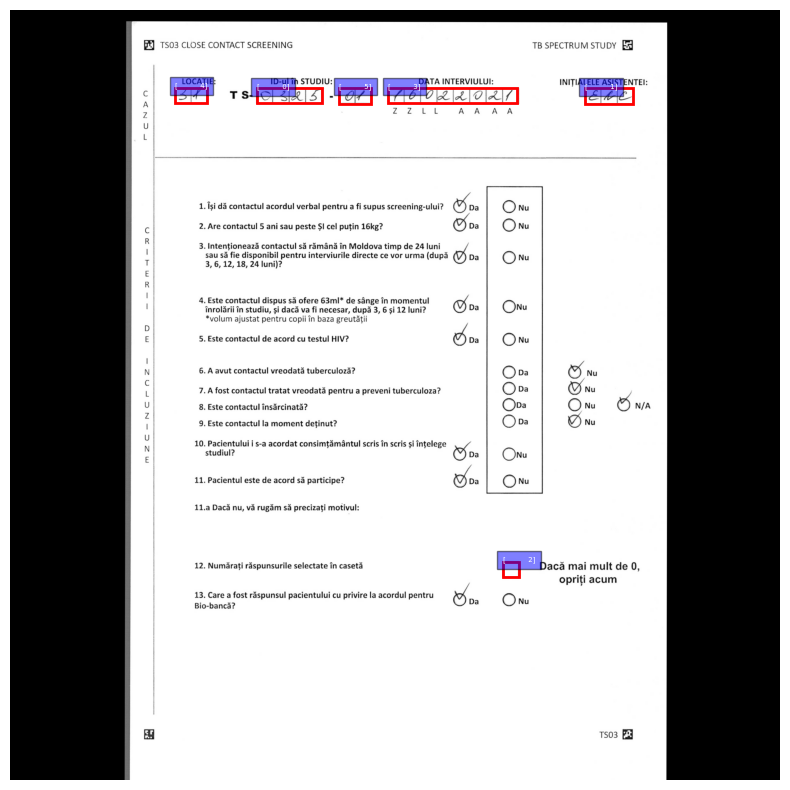

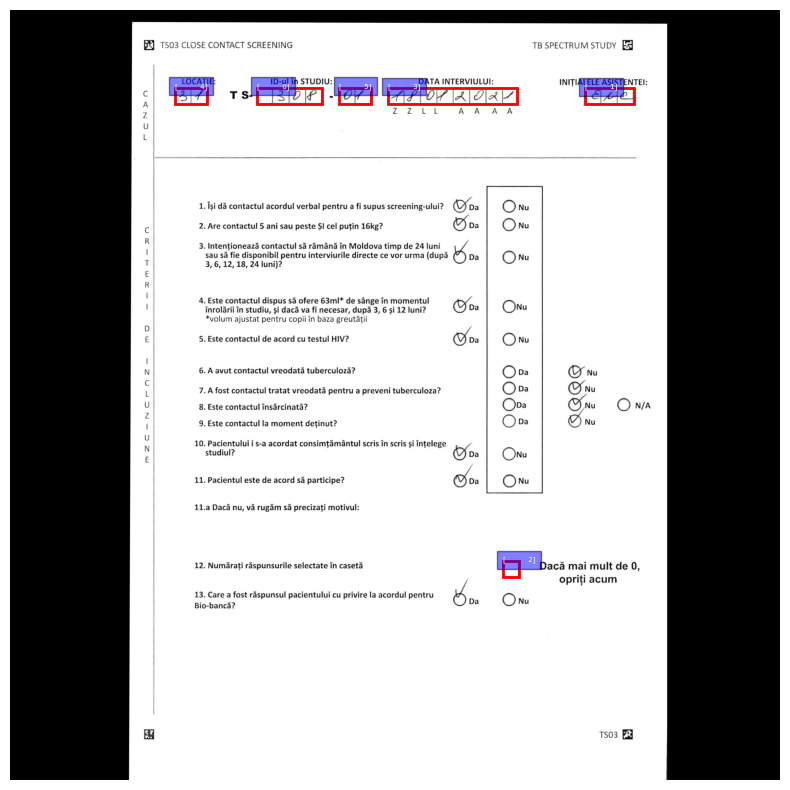

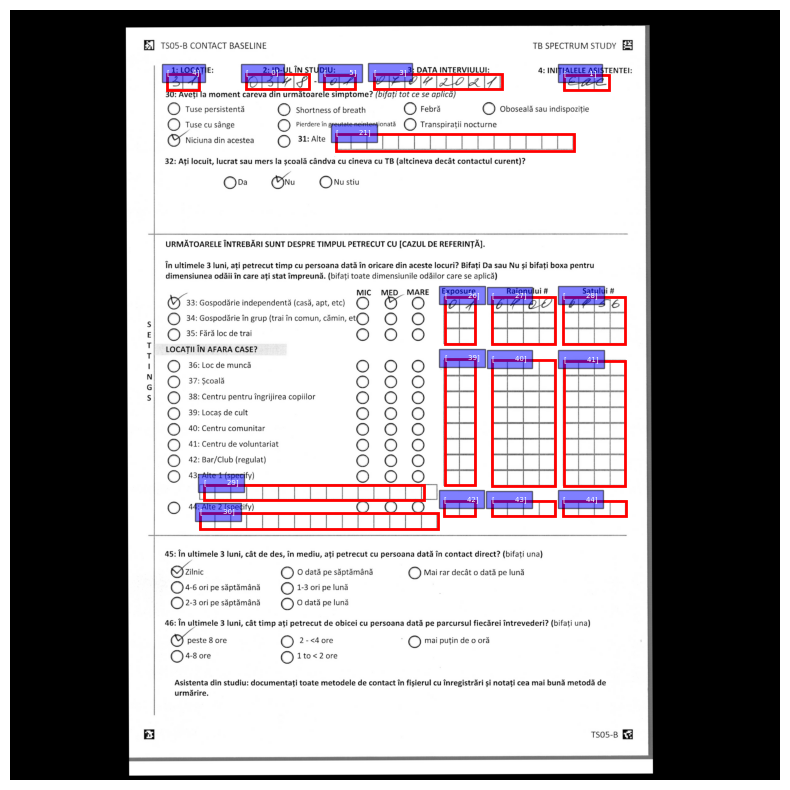

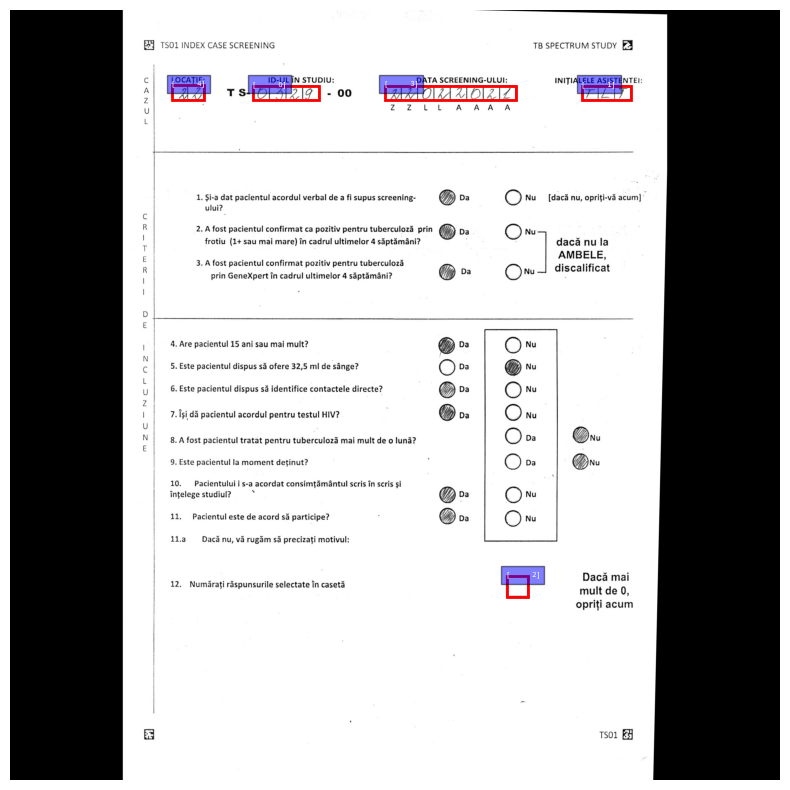

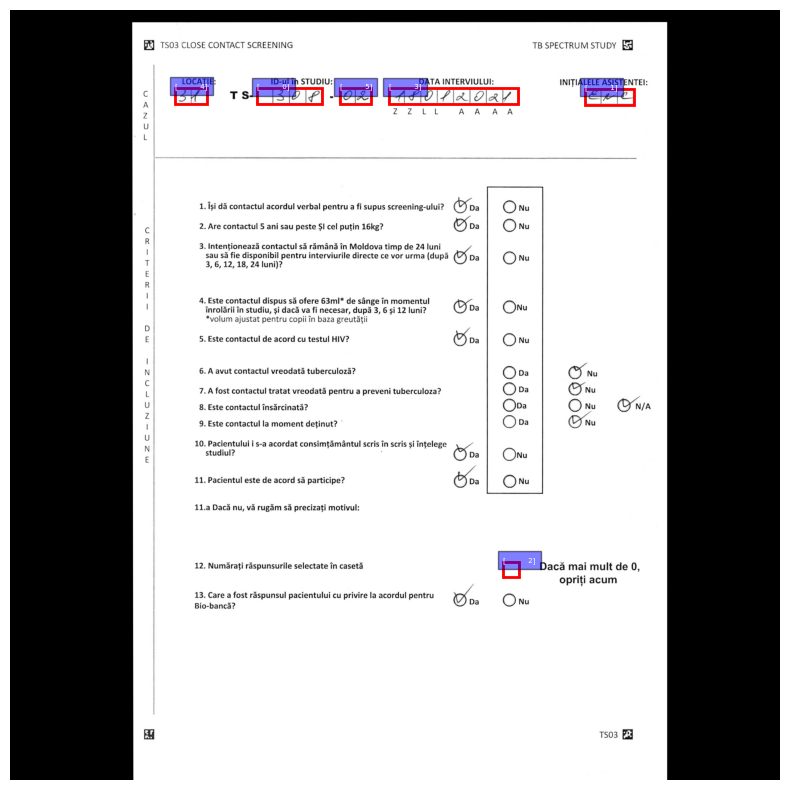

...

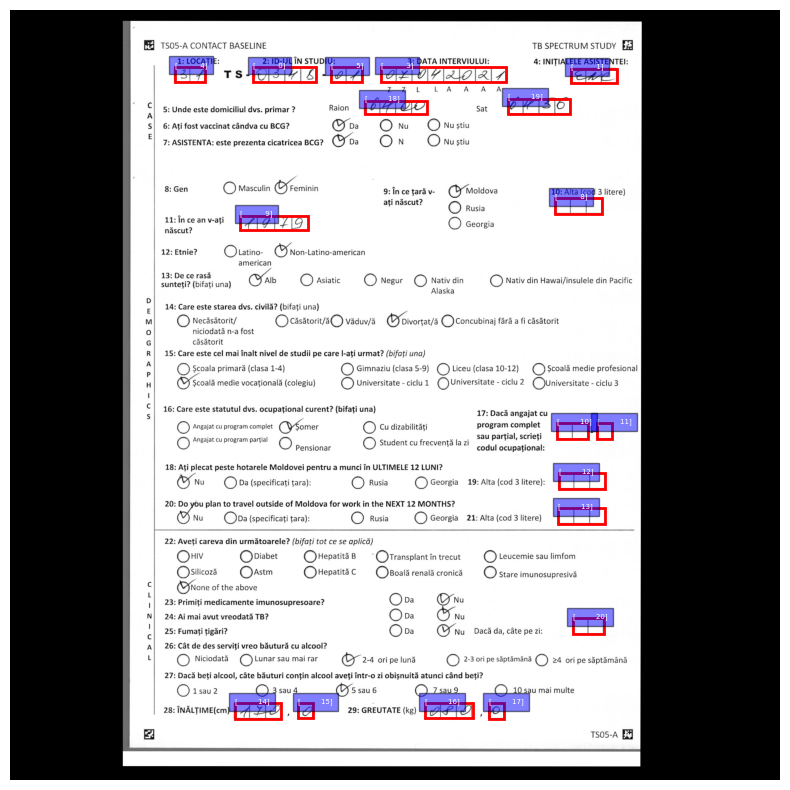

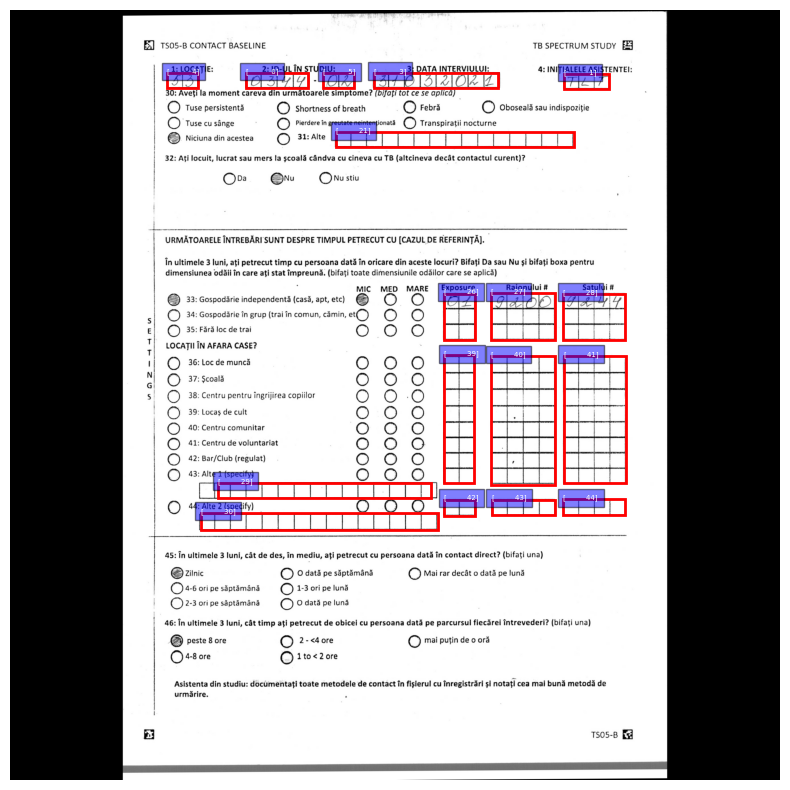

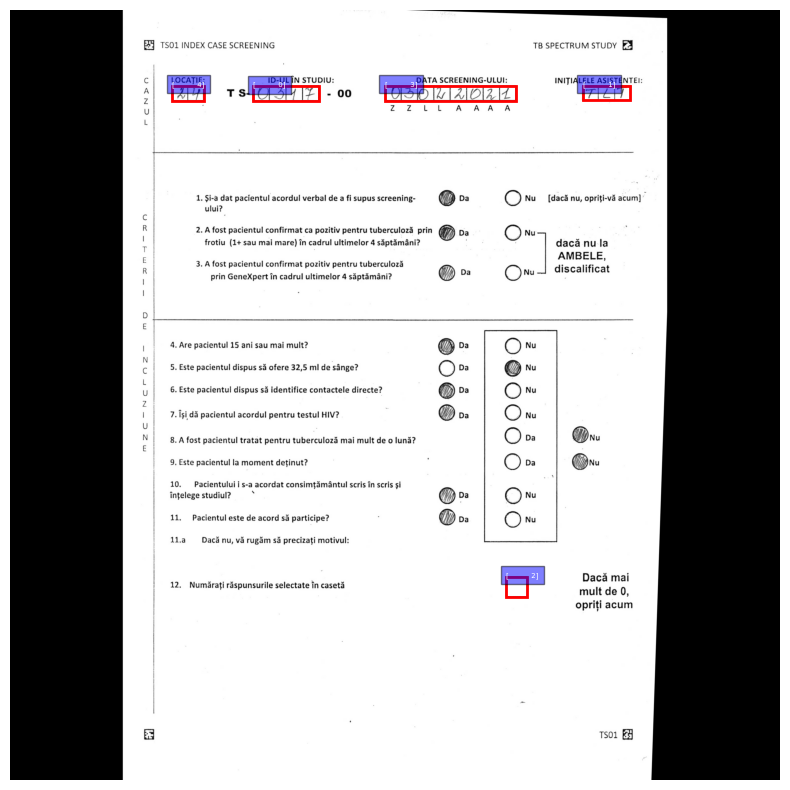

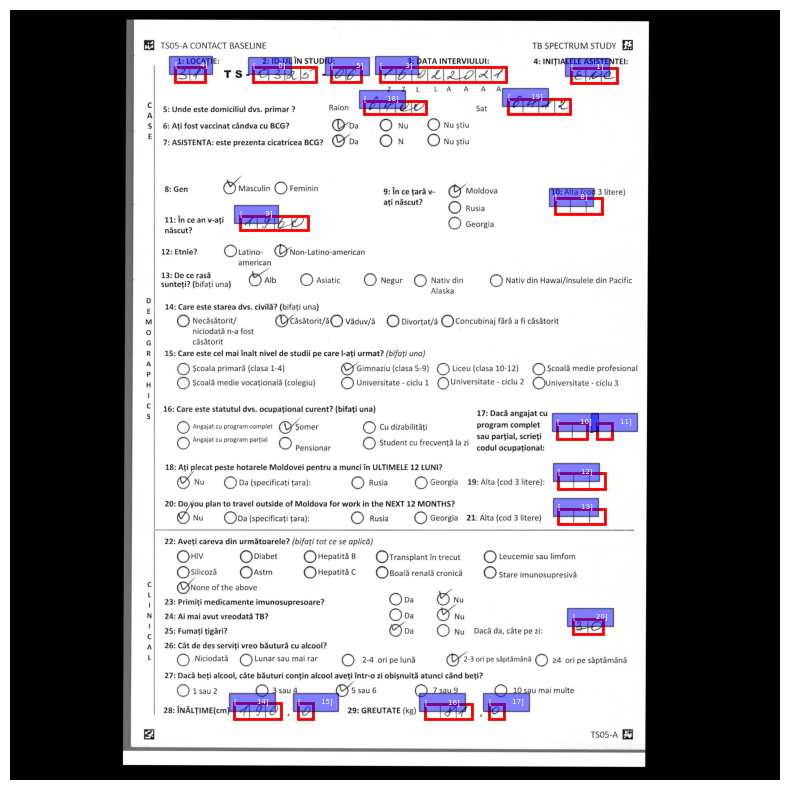

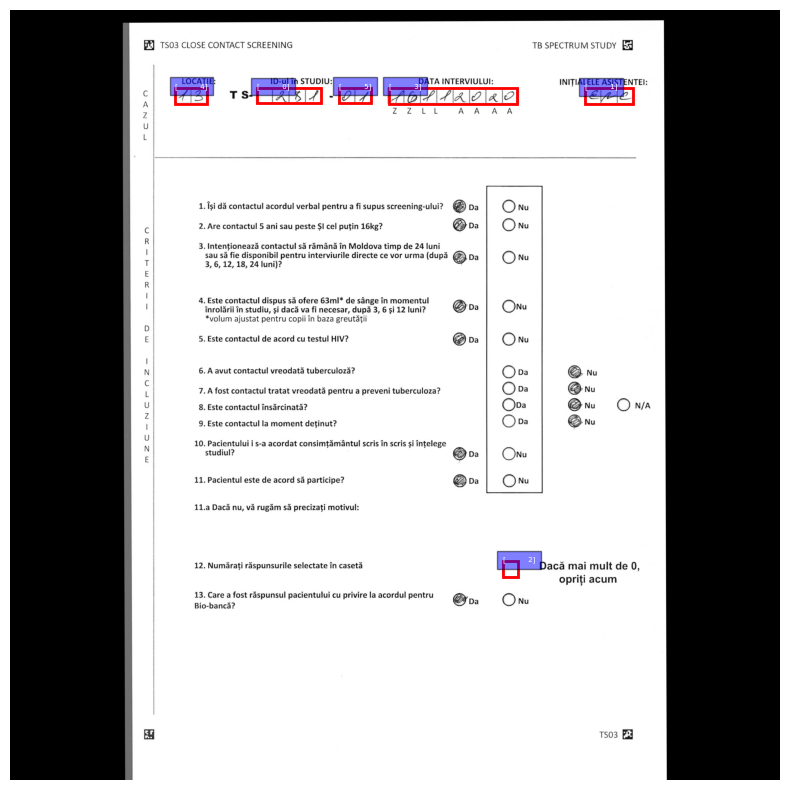

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Manually display images with bounding boxes using matplotlib
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Convert from BGR (OpenCV) to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image with matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')

    # Plot bounding boxes
    for box in result.boxes:  # Assuming 'result.boxes' has the bounding boxes
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()  # Convert to numpy array
        label = box.cls.cpu().numpy()  # class label as numpy array

        # Draw rectangle (Bounding box)
        plt.gca().add_patch(plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2))

        # Add class label text (optional)
        plt.text(x1, y1, f"{label}", color="white", fontsize=5,
                 bbox=dict(facecolor='blue', alpha=0.5))

    # Show the image with bounding boxes
    plt.show()

In [ ]:
import os
import cv2

# Directory where you want to save the images with bounding boxes
output_dir = '/content/drive/MyDrive/yolo_train/output'
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Define font and color for drawing the bounding boxes and text
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.9
font_thickness = 1
box_color = (0, 0, 255)  # Red bounding box
text_color = (255, 0, 0)  # blue text

# Manually process and save images with bounding boxes
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Plot bounding boxes
    for box in result.boxes:
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # Convert to integer
        label = int(box.cls.cpu().numpy()[0])  # Convert class label to integer

        # Draw the rectangle (Bounding box)
        cv2.rectangle(img, (x1, y1), (x2, y2), box_color, 2)  # 2 = thickness of the box

        # Put the class label text on the image (optional)
        label_text = f"Class: {label}"
        cv2.putText(img, label_text, (x1, y1 - 10), font, font_scale, text_color, font_thickness, lineType=cv2.LINE_AA)

    # Save the image with bounding boxes
    output_image_path = os.path.join(output_dir, f"result_{idx}.png")
    cv2.imwrite(output_image_path, img)


# downloads model weights to local storage

In [ ]:
import shutil
from google.colab import files

# Path to the folder you want to download
folder_to_zip = '/content/runs'
output_zip_file = '/content/runs.zip'

# Zip the folder
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', folder_to_zip)

# Download the zip file
files.download(output_zip_file)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>